#Yelp Check-in Dataset EDA:- 
####A check-in represents a recorded customer visit to a business at a specific timestamp and is used to analyze customer traffic patterns and business popularity.
  
##Dataset:
###yelp_academic_dataset_checkin.json
 
##Objective:
### Analyze customer visit patterns and identify business traffic trends and peak hours.
 


##Step 1: Import Required Libraries

In [0]:
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.window import Window
from pyspark.sql.functions import count, when, col
from pyspark.sql.functions import year, month, quarter, dayofweek, hour
from pyspark.sql.functions import explode, split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

## Set the JSON Path

In [0]:
# ============================================
# Step 2: Path (raw JSON source)
# ============================================
checkin_json_path = "/Volumes/yelp_project/yelp_json_files/yelp_datasets/yelp_dataset/yelp_academic_dataset_checkin.json"


## Step 3: Load Check-in Dataset (JSON)

In [0]:
# ============================================
# Step 3: JSON वरून थेट वाचा (No Parquet conversion)
# ============================================
checkin_df = spark.read.json(checkin_json_path)
print(checkin_df)

DataFrame[business_id: string, date: string]


##DATASET UNDERSTANDING

### Step 4: Print the Schema

In [0]:
# Display schema to understand dataset structure
checkin_df.printSchema()

root
 |-- business_id: string (nullable = true)
 |-- date: string (nullable = true)



###Step 5: Rows & Columns

In [0]:
print("Rows :", checkin_df.count())
print("Columns :", len(checkin_df.columns))
checkin_df.columns

Rows : 131930
Columns : 2


['business_id', 'date']

##Silver Layer:- Data cleaning, timestamp conversion, and feature engineering.

#DATA QUALITY

##Step 6: Check the Null Values

In [0]:
# Check for null values in each column
null_df = checkin_df.select([
    count(when(col(c).isNull(), c)).alias(c)
    for c in checkin_df.columns
])

display(null_df)

# Drop null values
checkin_df = checkin_df.dropna()

business_id,date
0,0


##Step 7: Duplicate Records

In [0]:
# Check for duplicate records
duplicates = checkin_df.count() - checkin_df.dropDuplicates().count()

print("Duplicate Records :", duplicates)

Duplicate Records : 0


#FEATURE ENGINERING

##Step 8: Explode Check-in Timestamps

###Each business stores all check-ins in one string.

In [0]:

checkin_exploded = (

    checkin_df
    .withColumn(
        "checkin_timestamp",
        explode(split(col("date"), ", "))
    )
)


##Step 9: Convert to Timestamp

In [0]:
# Validate timestamp format after exploding dates
checkin_exploded = checkin_exploded.withColumn(
    "checkin_timestamp",
    to_timestamp("checkin_timestamp")
)

display(checkin_exploded)
checkin_exploded.printSchema()


business_id,date,checkin_timestamp
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-03-13T21:10:56.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-06-02T22:18:06.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-07-24T22:42:27.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-10-24T21:36:13.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-12-09T21:23:33.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-01-20T17:34:57.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-04-30T21:02:03.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-05-25T21:16:54.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-08-06T21:08:08.000Z
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-10-02T15:15:42.000Z


root
 |-- business_id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- checkin_timestamp: timestamp (nullable = true)



##Step 10: Invalid Timestamp Analysis Check

In [0]:
invalid_timestamp = checkin_exploded.filter(
    col("checkin_timestamp").isNull()
).count()

print("Invalid timestamps:", invalid_timestamp)

Invalid timestamps: 0


##Step 11: Create Date Features

In [0]:
checkin_final = (
    checkin_exploded
    .withColumn("year", year("checkin_timestamp"))
    .withColumn("month", month("checkin_timestamp"))
    .withColumn("quarter", quarter("checkin_timestamp"))
    .withColumn("weekday", date_format("checkin_timestamp","EEEE"))
    .withColumn("hour", hour("checkin_timestamp"))
)

display(checkin_final)
checkin_final.printSchema()

business_id,date,checkin_timestamp,year,month,quarter,weekday,hour
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-03-13T21:10:56.000Z,2020,3,1,Friday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-06-02T22:18:06.000Z,2020,6,2,Tuesday,22
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-07-24T22:42:27.000Z,2020,7,3,Friday,22
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-10-24T21:36:13.000Z,2020,10,4,Saturday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2020-12-09T21:23:33.000Z,2020,12,4,Wednesday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-01-20T17:34:57.000Z,2021,1,1,Wednesday,17
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-04-30T21:02:03.000Z,2021,4,2,Friday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-05-25T21:16:54.000Z,2021,5,2,Tuesday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-08-06T21:08:08.000Z,2021,8,3,Friday,21
---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020-07-24 22:42:27, 2020-10-24 21:36:13, 2020-12-09 21:23:33, 2021-01-20 17:34:57, 2021-04-30 21:02:03, 2021-05-25 21:16:54, 2021-08-06 21:08:08, 2021-10-02 15:15:42, 2021-11-11 16:23:50",2021-10-02T15:15:42.000Z,2021,10,4,Saturday,15


root
 |-- business_id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- checkin_timestamp: timestamp (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- quarter: integer (nullable = true)
 |-- weekday: string (nullable = true)
 |-- hour: integer (nullable = true)



##DATA UNDERSTANDING

###Step 12: Total Check-ins

In [0]:
# Total number of check-ins
total_checkins = checkin_final.count()

print("Total Check-ins:", total_checkins)

###Step 13: Total Businesses with Check-ins

In [0]:
# Total businesses having at least one check-in
total_businesses = checkin_final.select(
    countDistinct("business_id")
).collect()[0][0]

print("Total Businesses with Check-ins:", total_businesses)

### Step 14: Average Check-ins per Business

In [0]:
# Calculate average check-ins per business
business_checkins = (
    checkin_final
    .groupBy("business_id")
    .count()
)

avg_checkins = business_checkins.select(
    avg("count").alias("Average_Checkins_Per_Business")
)

display(avg_checkins)

Average_Checkins_Per_Business
101.24213598120215


###Step 15: Median Check-ins per Business

In [0]:
# Calculate median check-ins per business
median_checkins = business_checkins.approxQuantile(
    "count",
    [0.5],
    0.01
)

print("Median Check-ins Per Business:", median_checkins[0])

Median Check-ins Per Business: 20.0


###Step 16: Date Range of Check-ins /  Overall time span of check-in activity

In [0]:
# Find earliest and latest check-in date
date_range = checkin_final.select(
    min("checkin_timestamp").alias("Start_Date"),
    max("checkin_timestamp").alias("End_Date")
)

display(date_range)

Start_Date,End_Date
2009-12-30T02:53:27.000Z,2022-01-19T16:48:37.000Z


###Step 17: Summary

In [0]:
summary_df = checkin_final.select(
    count("*").alias("Total_Checkins"),
    countDistinct("business_id").alias("Total_Businesses"),
    min("checkin_timestamp").alias("Start_Date"),
    max("checkin_timestamp").alias("End_Date")
)

display(summary_df)

Total_Checkins,Total_Businesses,Start_Date,End_Date
13356875,131930,2009-12-30T02:53:27.000Z,2022-01-19T16:48:37.000Z


##Gold Layer:-Business aggregations and KPI generation for reporting and dashboard development.

#TIME-BASED ANALYSIS

### Step 18: Check-ins per Year OR Yearly Customer Visit Trends

year,count
2009,2
2010,209153
2011,901457
2012,1289492
2013,1552799
2014,1625884
2015,1709857
2016,1554774
2017,1348466
2018,1157252


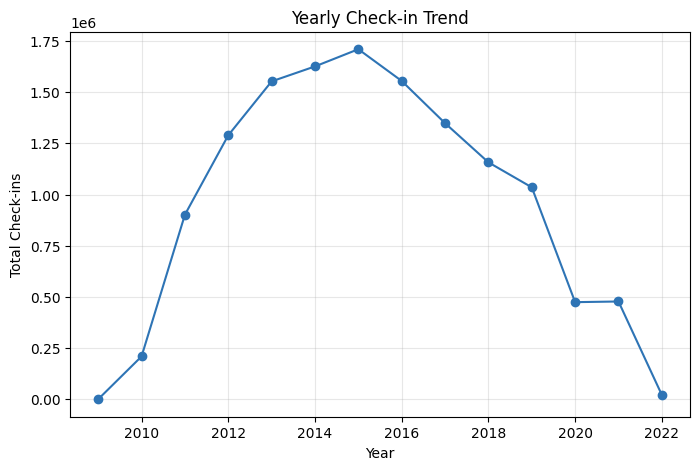

In [0]:
# Analyze yearly customer visit trends
yearly_checkins = (
    checkin_final
    .groupBy("year")
    .count()
    .orderBy("year")
)

display(yearly_checkins)


#Plot the data using Matplotlib


plot_data = yearly_checkins.toPandas().sort_values("year")
plt.figure(figsize=(8, 5))
plt.plot(plot_data["year"], plot_data["count"], marker="o", color="#2E74B5")
plt.title("Yearly Check-in Trend")
plt.xlabel("Year")
plt.ylabel("Total Check-ins")
plt.grid(alpha=0.3)
plt.show()


###Step 19: Check-ins per Month OR Monthly Customer Visit Trends

In [0]:
# Analyze monthly customer visit trends
monthly_checkins = (
    checkin_final
    .groupBy("month")
    .count()
    .orderBy("month")
)

display(monthly_checkins)

#Plot the data using Matplotlib


plot_data = monthly_checkins.toPandas().sort_values("month")
plt.figure(figsize=(8, 5))
plt.plot(plot_data["month"], plot_data["count"], marker="o", color="#6A4C93")
plt.title("Monthly Check-in Trend")
plt.xlabel("Month")
plt.ylabel("Total Check-ins")
plt.xticks(range(1, 13))
plt.grid(alpha=0.3)
plt.show()
 

###Step 20: Check-ins per Quarter OR Quarterly Traffic Pattern

quarter,count
1,3270951
2,3411495
3,3443235
4,3231194


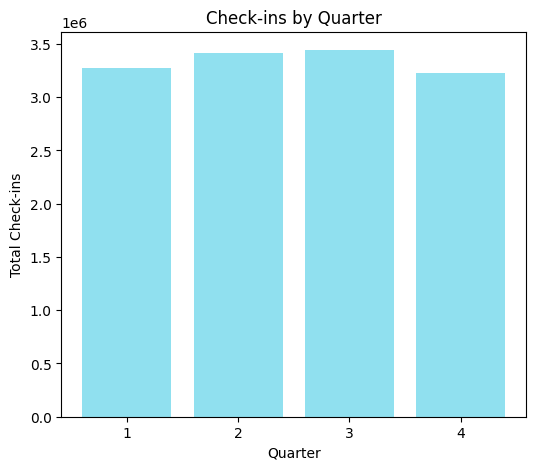

In [0]:
# Analyze quarterly customer visit trends
quarterly_checkins = (
    checkin_final
    .groupBy("quarter")
    .count()
    .orderBy("quarter")
)

display(quarterly_checkins)

#Plot the data using Matplotlib
plot_data = quarterly_checkins.toPandas().sort_values("quarter")
plt.figure(figsize=(6, 5))
plt.bar(plot_data["quarter"].astype(str), plot_data["count"], color="#90E0EF")
plt.title("Check-ins by Quarter")
plt.xlabel("Quarter")
plt.ylabel("Total Check-ins")
plt.show()


###Step 21: Check-ins per Weekday OR Weekday Traffic Pattern

weekday,count
Saturday,2810469
Friday,1959015
Monday,1491993
Tuesday,1460432
Thursday,1612496
Sunday,2480701
Wednesday,1541769


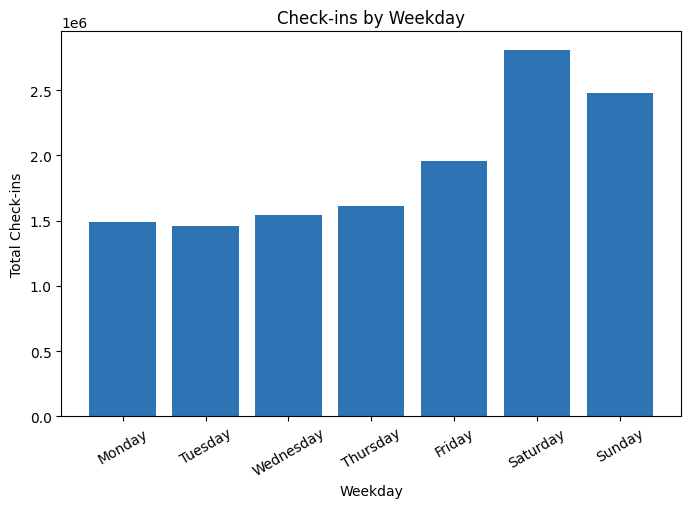

In [0]:
# Analyze weekday traffic pattern
weekday_checkins = (
    checkin_final
    .groupBy("weekday")
    .count()
)

display(weekday_checkins)



#Plot the data using Matplotlib
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
pdf = weekday_checkins.toPandas()
pdf["weekday"] = pdf["weekday"].astype("category").cat.set_categories(order)
pdf = pdf.sort_values("weekday")
plt.figure(figsize=(8, 5))
plt.bar(pdf["weekday"], pdf["count"], color="#2E74B5")
plt.title("Check-ins by Weekday")
plt.xlabel("Weekday")
plt.ylabel("Total Check-ins")
plt.xticks(rotation=30)
plt.show()
 

###Step 22: Check-ins per Hour OR Hourly Traffic Pattern

hour,count
0,1155092
1,935985
2,669574
3,437035
4,264905
5,152476
6,85066
7,52295
8,35589
9,37079


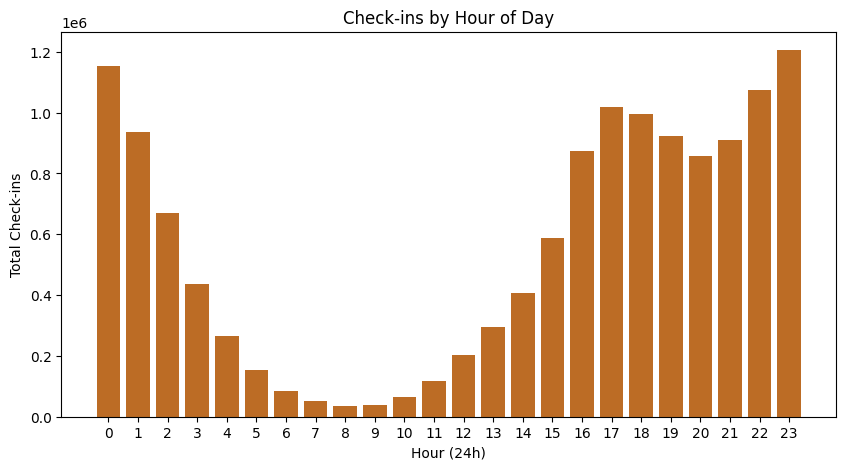

In [0]:
# Analyze hourly traffic pattern
hourly_checkins = (
    checkin_final
    .groupBy("hour")
    .count()
    .orderBy("hour")
)

display(
    hourly_checkins)



#Plot the data using Matplotlib
plot_data = hourly_checkins.toPandas().sort_values("hour")
plt.figure(figsize=(10, 5))
plt.bar(plot_data["hour"], plot_data["count"], color="#BC6C25")
plt.title("Check-ins by Hour of Day")
plt.xlabel("Hour (24h)")
plt.ylabel("Total Check-ins")
plt.xticks(range(0, 24))
plt.show()

###Step 23: Weekday VS Weekend

day_type,count,percentage
Weekend,5291170,39.61
Weekday,8065705,60.39


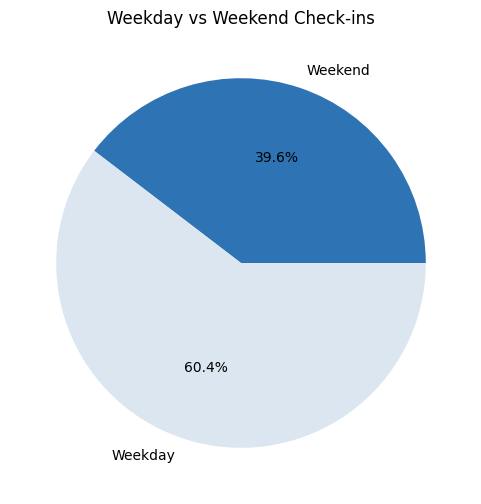

In [0]:
from pyspark.sql.functions import *

from pyspark.sql.functions import when, col

weekend_df = (
    checkin_final
    .withColumn(
        "day_type",
        when(
            col("weekday").isin(
                "Saturday",
                "Sunday"
            ),
            "Weekend"
        ).otherwise("Weekday")
    )
)

total_checkins_wd = weekend_df.count()

weekend_percentage_df = (
    weekend_df
    .groupBy("day_type")
    .count()
    .withColumn(
        "percentage",
        round(
            (col("count") / total_checkins_wd) * 100, 2
            )
    )
)

display(weekend_percentage_df)

#Plot the data using Matplotlib
plot_data = weekend_df.groupBy("day_type").count().toPandas()
plt.figure(figsize=(6, 6))
plt.pie(plot_data["count"], labels=plot_data["day_type"], autopct="%1.1f%%",
        colors=["#2E74B5", "#DCE6F1"])
plt.title("Weekday vs Weekend Check-ins")
plt.show()

#BUSINESS ANALYSIS

##Step 24: Top 20 Businesses by Check-ins

business_id,count
-QI8Qi8XWH3D8y8ethnajA,52144
FEXhWNCMkv22qG04E83Qjg,40109
Eb1XmmLWyt_way5NNZ7-Pw,37562
c_4c5rJECZSfNgFj7frwHQ,37518
4i4kmYm9wgSNyF1b6gKphg,31168
8O35ji_yOMVJmZ6bl96yhQ,29606
VQcCL9PiNL_wkGf-uF3fjg,28927
ac1AeYqs8Z4_e2X5M3if2A,21542
QTbahs-GVuWYL5yfdjH34A,21487
ytynqOUb3hjKeJfRj5Tshw,18615


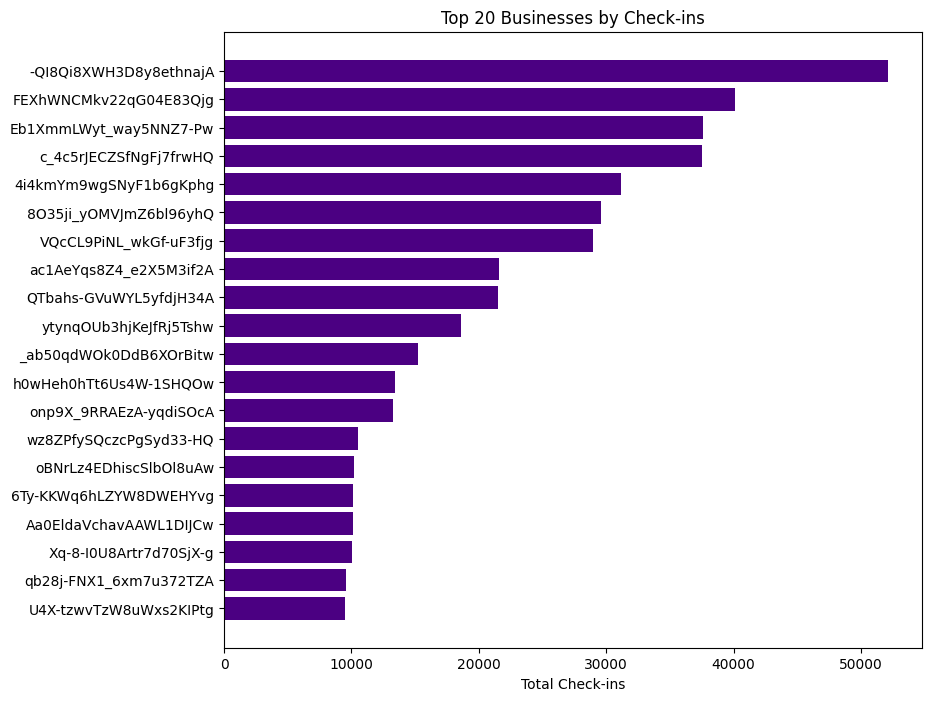

In [0]:
# Identify businesses with highest check-ins
top_businesses = (
    checkin_final
    .groupBy("business_id")
    .count()
    .orderBy(desc("count"))
)

display(top_businesses.limit(20))


#Plot the data using Matplotlib
pdf = top_businesses.orderBy(desc("count")).limit(20).toPandas()
plt.figure(figsize=(9, 8))
plt.barh(pdf["business_id"], pdf["count"], color="#4B0082")
plt.title("Top 20 Businesses by Check-ins")
plt.xlabel("Total Check-ins")
plt.gca().invert_yaxis()
plt.show()

##Step 25: Bottom 20 Businesses by Check-ins

In [0]:
# Identify businesses with lowest check-ins
display(
    top_businesses.orderBy("count").limit(20)
)



business_id,count
3FvyYvyhni6JZjnL59tkDQ,1
128uR8pLgiHKc9ODW_qdWg,1
6XbWyp7b3HZU0o31vSgdxQ,1
1pJOnROoaVL9nxwzqz6dTQ,1
2HX9JkC95PLjjwHs2Y1Beg,1
4KS_2qM4xnL46ZvSZrc2Fg,1
5SVVXuGC_OmLQFIt4eIrpA,1
04zP1Y6kdBNBXUJ3mjuJ0Q,1
3d0Tgb2xTH_U3yGr0GANyA,1
1fIcH6EfKXuE5gi7WiRcAg,1


##Step 26: Distribution of Check-ins

business_id,count
-GLapzja21a5YL98C7Zxxg,17
-RGQ1876a50Xx4lO2epFGg,35
-RpUSbVtSGO9LZwMzGogww,15
-kz82pLe268Cw59S6fD1BQ,52
-rjyBtrqHR0VJSbLG-ynew,3
-xV7ESuXJglzA_kdd8a7Mw,657
-yu4koRugjxrnsey25oIuw,46
0DzFUBKOMH8ofogXZYBvTg,1
0KgwrV_ACGYEEo6aBwNxyg,65
0e88yz9OB_2XS_04DkS7_w,5


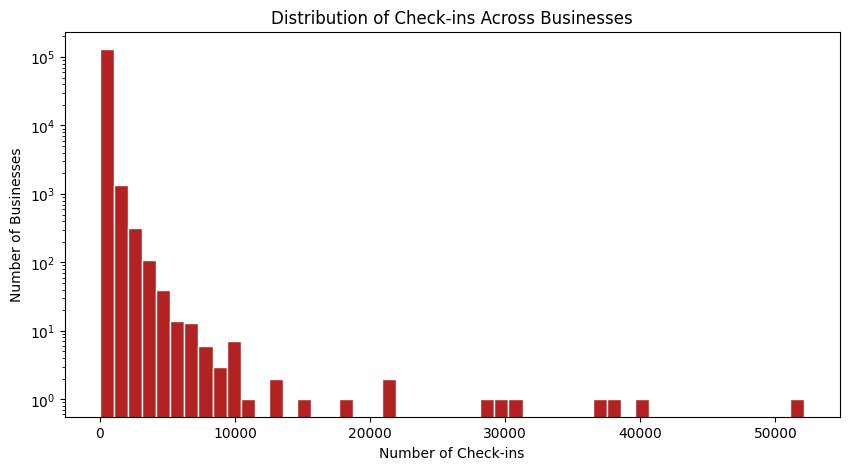

In [0]:
# Distribution of business traffic
business_distribution = (
    checkin_final
    .groupBy("business_id")
    .count()
)

display(business_distribution)

#Plot the data using Matplotlib
plot_data = business_distribution.toPandas()
plt.figure(figsize=(10, 5))
plt.hist(plot_data["count"], bins=50, color="#B22222", edgecolor="white")
plt.title("Distribution of Check-ins Across Businesses")
plt.xlabel("Number of Check-ins")
plt.ylabel("Number of Businesses")
plt.yscale("log")
plt.show()

##Step 27: Top 10% Business Contribution

###To determine whether customer traffic is concentrated among a small number of businesses or evenly distributed across all businesses."


Top 10% businesses contribute 67.80% of total check-ins


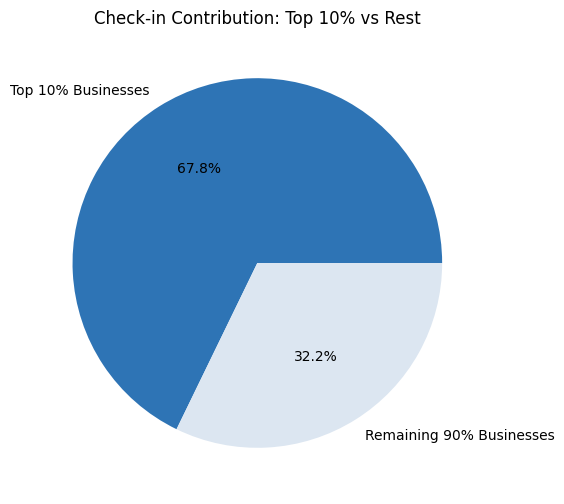

In [0]:
# Total check-ins across all businesses
total_checkins = business_distribution.agg(

    sum("count").alias("total_checkins")

).collect()[0]["total_checkins"]

# Number of businesses in top 10%
top_n = int(
    business_distribution.count() * 0.10
)

# Total check-ins generated by top 10% businesses
top_sum = (
    business_distribution
    .orderBy(desc("count"))
    .limit(top_n)
    .agg(sum("count"))
    .collect()[0][0]
)
# Contribution percentage
contribution = (top_sum / total_checkins) * 100

print(
    f"Top 10% businesses contribute {contribution:.2f}% of total check-ins"
)


#Plot the data using Matplotlib
plot_data = pd.DataFrame({
    "Segment": ["Top 10% Businesses", "Remaining 90% Businesses"],
    "Contribution": [contribution, 100 - contribution]
})
plt.figure(figsize=(6, 6))
plt.pie(plot_data["Contribution"], labels=plot_data["Segment"], autopct="%1.1f%%",
        colors=["#2E74B5", "#DCE6F1"])
plt.title("Check-in Contribution: Top 10% vs Rest")
plt.show()

#ADVANCED ANALYSIS

##Step 28: Peak vs Off-Peak Traffic


traffic,count
Peak,4708627
Off Peak,8648248


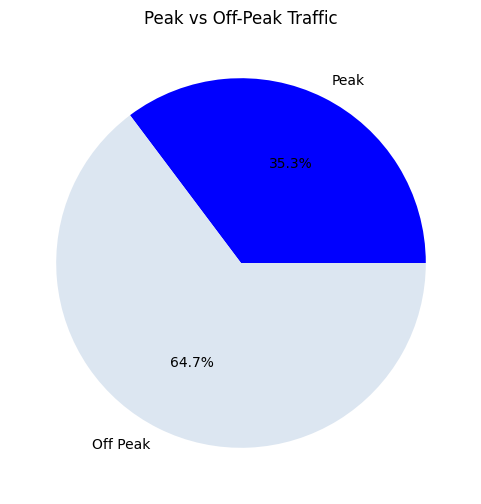

In [0]:
peak_df = (
    checkin_final
    .withColumn(
        "traffic",
        when(
            col("hour").between(11,14),
            "Peak"
        )
        .when(
            col("hour").between(18,21),
            "Peak"
        )
        .otherwise("Off Peak")
    )
)

display(
    peak_df.groupBy("traffic").count()
)


#Plot the data using Matplotlib

plot_data = peak_df.groupBy("traffic").count().toPandas()
plt.figure(figsize=(6, 6))
plt.pie(plot_data["count"], labels=plot_data["traffic"], autopct="%1.1f%%",
        colors=["#0000FF", "#DCE6F1"])
plt.title("Peak vs Off-Peak Traffic")
plt.show()
 

##Step 29: Lunch vs Dinner

meal_time,count
Other,8648248
Dinner,3686991
Lunch,1021636


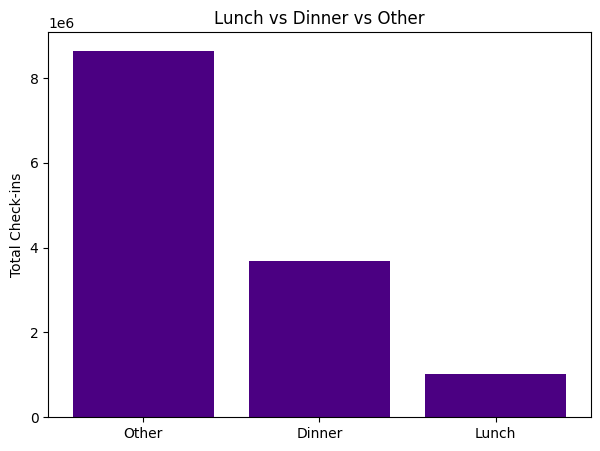

In [0]:
meal_df = (
    checkin_final
    .withColumn(
        "meal_time",
        when(
            col("hour").between(11,14),
            "Lunch"
        )
        .when(
            col("hour").between(18,21),
            "Dinner"
        )
        .otherwise("Other")
    )
)

display(
    meal_df.groupBy("meal_time").count()
)

#Plot the data using Matplotlib
plot_data = meal_df.groupBy("meal_time").count().toPandas()
plt.figure(figsize=(7, 5))
plt.bar(plot_data["meal_time"], plot_data["count"], color="#4B0082")
plt.title("Lunch vs Dinner vs Other")
plt.ylabel("Total Check-ins")
plt.show()

##Step 30: Seasonal Trends

season,count
Winter,3175732
Summer,3483462
Autumn,3234416
Spring,3463265


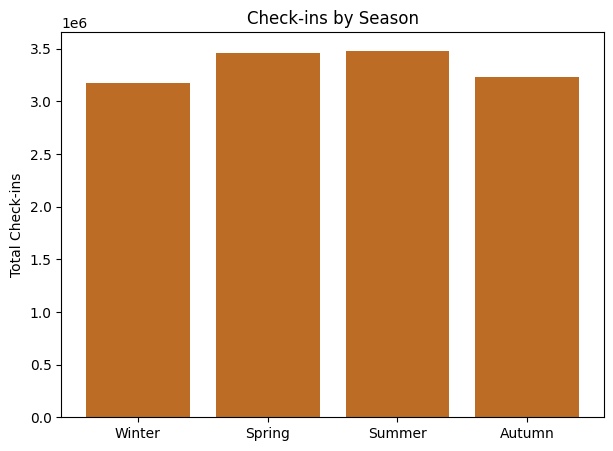

In [0]:
season_df = (
    checkin_final
    .withColumn(
        "season",
        when(col("month").isin(12,1,2),"Winter")
        .when(col("month").isin(3,4,5),"Spring")
        .when(col("month").isin(6,7,8),"Summer")
        .otherwise("Autumn")
    )
)

display(
    season_df.groupBy("season").count()
)


#Plot the data using Matplotlib

season_order = ["Winter", "Spring", "Summer", "Autumn"]
plot_data = season_df.groupBy("season").count().toPandas()
plot_data["season"] = plot_data["season"].astype("category").cat.set_categories(season_order)
plot_data = plot_data.sort_values("season")
plt.figure(figsize=(7, 5))
plt.bar(plot_data["season"], plot_data["count"], color="#BC6C25")
plt.title("Check-ins by Season")
plt.ylabel("Total Check-ins")
plt.show()

##Step 31: Hour x Day HeatMap

weekday,hour,count
Monday,10,9871
Thursday,7,4680
Thursday,11,18647
Tuesday,14,44854
Thursday,0,150894
Sunday,21,158183
Wednesday,21,104757
Friday,1,128682
Tuesday,4,23038
Wednesday,12,30424


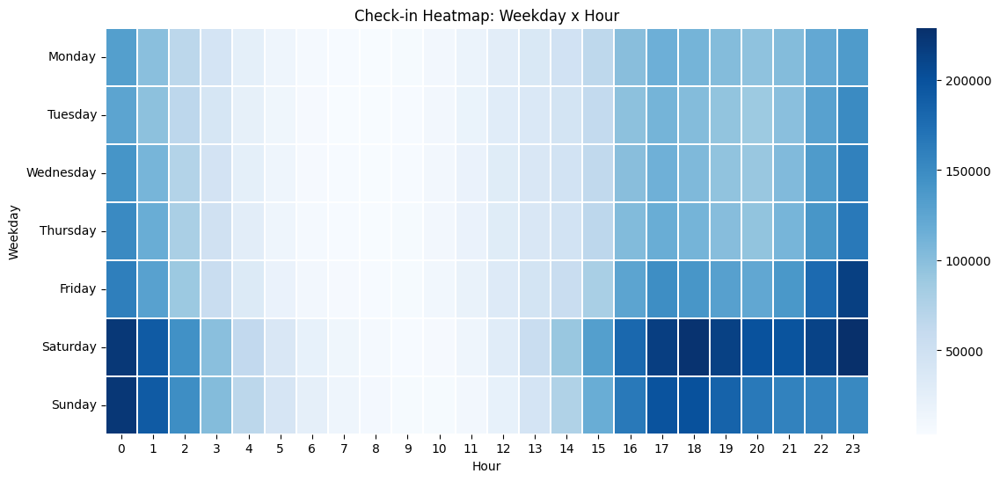

In [0]:
heatmap1 = (
    checkin_final
    .groupBy("weekday","hour")
    .count()
)

display(heatmap1)


 
#Plot the data using HeatMap
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
plot_data = heatmap1.toPandas()
pivot1 = plot_data.pivot(index="weekday", columns="hour", values="count").reindex(order)
plt.figure(figsize=(14, 6))
sns.heatmap(pivot1, cmap="Blues", linewidths=0.3)
plt.title("Check-in Heatmap: Weekday x Hour")
plt.xlabel("Hour")
plt.ylabel("Weekday")
plt.show()

##Step 32: Month × Day Heatmap

month,weekday,count
7,Wednesday,143692
4,Friday,166495
5,Monday,135279
1,Wednesday,118617
11,Friday,154236
5,Tuesday,129846
6,Friday,166427
11,Sunday,196108
8,Thursday,144843
3,Wednesday,131677


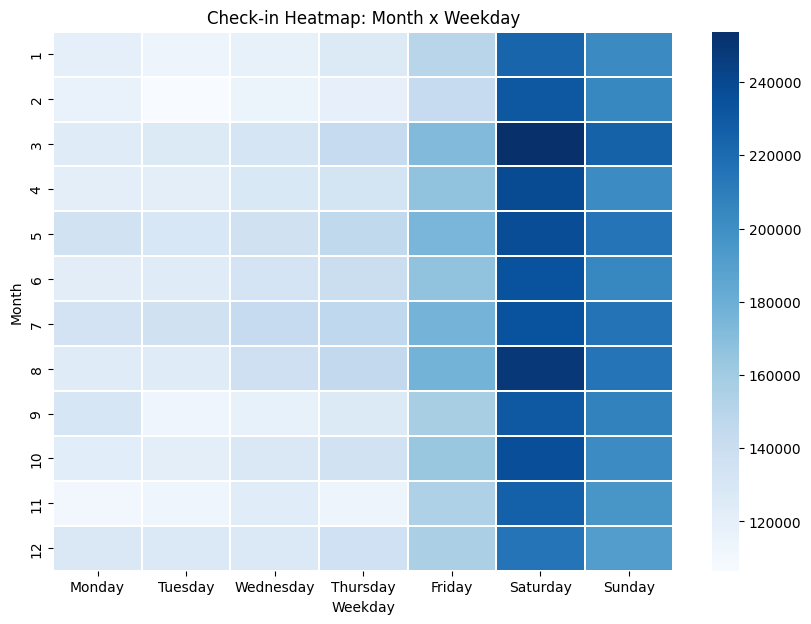

In [0]:
heatmap2 = (
    checkin_final
    .groupBy("month","weekday")
    .count()
)

display(heatmap2)

#Plot the data using HeatMap
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
plot_data = heatmap2.toPandas()
pivot2 = plot_data.pivot(index="month", columns="weekday", values="count")[order]
plt.figure(figsize=(10, 7))
sns.heatmap(pivot2, cmap="Blues", linewidths=0.3)
plt.title("Check-in Heatmap: Month x Weekday")
plt.xlabel("Weekday")
plt.ylabel("Month")
plt.show()


# ------FINAL BUSINESS INSIGHTS--------

##1. Peak traffic occurs during evening hours.
##2. Weekend traffic exceeds weekday traffic.
##3. Top 10% businesses generate 67.80% of all check-ins.
##4. Dinner traffic is higher than lunch traffic.
##5. Customer traffic demonstrates seasonal behavior.
##6. Customer visits decreased significantly during 2020.





# ------FINAL BUSINESS OUTCOMES-------
##1. Optimize staffing during peak periods.
##2. Improve promotional campaigns during off-peak periods.
##3. Enhance inventory planning using demand forecasts.
##4. Allocate resources efficiently across business locations.
##5. Design seasonal marketing strategies.

#FLOW OF CODE

##1. Import Required Libraries

                ↓
#             Bronze Layer
                ↓

##2. Load checkin.json from S3

                ↓

#         Silver Layer

                ↓

##3. Dataset Understanding
- ###  Schema 
- ### Rows and Columns

                ↓

##5. Data Quality Analysis
- ###      Null Values
- ###      Duplicate Records
- ###      Invalid Timestamps

                ↓

##6. Feature Engineering
- ###    Split comma-separated timestamps
- ###    Convert to TimestampType
- ###    Extract:
###         1. Year
###         2. Month
###         3. Quarter
###         4. Weekday
###         5. Hour

                ↓


##7. Dataset Understanding / Summary Statistics
###     1.Total Check-ins
###     2.Total Businesses with Check-ins
###     3.Average Check-ins per Business
###     4. Median Check-ins per Business
###     5. Date Range
###     6. Summary Metrics


                  ↓

#               Gold Layer

                  ↓


##8. Time-Based Analysis
- ###Check-ins per Year
- ###Check-ins per Month
- ###Check-ins per Quarter
- ###Weekday Traffic Pattern
- ###Hourly Traffic Pattern
- ###Weekend vs Weekday Traffic
    
                  ↓

##9. Business Analysis
- ### Top Businesses by Check-ins
- ### Bottom Businesses by Check-ins
- ### Distribution of Check-ins per Business
- ### Top 10% Business Contribution

                  ↓

##10. Advanced Analysis
- ###      Hour × Day Heatmap
- ###      Month × Day Heatmap
- ###      Peak vs Off-Peak Traffic
- ###      Lunch vs Dinner Traffic
- ###      Seasonal Trends
            
                  ↓
                  

##11. Final Business Insights
###   1. Peak traffic occurs during evening hours.
###    2. Weekend traffic exceeds weekday traffic.
###    3. Top 10% businesses generate 67.80% of all check-ins.
###    4. Dinner traffic is higher than lunch traffic.
###    5. Customer traffic demonstrates seasonal behavior.
###    6. Customer visits decreased significantly during 2020.

                ↓

##12.Final Business Outcomes
###    1. Optimize staffing during peak periods.
###    2. Improve promotional campaigns during off-peak periods.
###    3. Enhance inventory planning using demand forecasts.
###    4. Allocate resources efficiently across business locations.
###    5. Design seasonal marketing strategies.